<a href="https://colab.research.google.com/github/Raanank10/gun_violence-/blob/main/kaggle_EDA_of_Project_Gun_Violence_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

EDA Project Gun Violence Data

Import data:

# Import python packages

In [ ]:
!pip install chart-studio


import calendar
from datetime import datetime
import matplotlib.pyplot as plt
import chart_studio.plotly as py 
import plotly.graph_objs as go #importing graphical objects
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import re
from collections import Counter

import pandas as pd
import numpy as np

     |████████████████████████████████| 71kB 3.1MB/s 


## Import data, unzip and import to Dataframe

In [ ]:
#!unzip "gun-violence-data_01-2013_03-2018.csv.zip"
!unzip gun\ violence\ data.zip

Archive:  gun violence data.zip
  inflating: gun-violence-data.csv   


In [ ]:
#df = pd.read_csv('gun-violence-data_01-2013_03-2018.csv', parse_dates=True)
df = pd.read_csv('gun-violence-data.csv', parse_dates=True)

print(f"The shape of the raw data is: {df.shape}")
df.info()
df.head(2)

The shape of the raw data is: (239677, 29)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 239677 entries, 0 to 239676
Data columns (total 29 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   incident_id                  239677 non-null  int64  
 1   date                         239677 non-null  object 
 2   state                        239677 non-null  object 
 3   city_or_county               239677 non-null  object 
 4   address                      223180 non-null  object 
 5   n_killed                     239677 non-null  int64  
 6   n_injured                    239677 non-null  int64  
 7   incident_url                 239677 non-null  object 
 8   source_url                   239209 non-null  object 
 9   incident_url_fields_missing  239677 non-null  bool   
 10  congressional_district       227733 non-null  float64
 11  gun_stolen                   140179 non-null  object 
 12  gun_type       

,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,incident_url_fields_missing,congressional_district,gun_stolen,gun_type,incident_characteristics,latitude,location_description,longitude,n_guns_involved,notes,participant_age,participant_age_group,participant_gender,participant_name,participant_relationship,participant_status,participant_type,sources,state_house_district,state_senate_district
0,461105,2013-01-01,Pennsylvania,Mckeesport,1506 Versailles Avenue and Coursin Street,0,4,http://www.gunviolencearchive.org/incident/461105,http://www.post-gazette.com/local/south/2013/0...,False,14.0,NaN,NaN,Shot - Wounded/Injured||Mass Shooting (4+ vict...,40.3467,NaN,-79.8559,NaN,Julian Sims under investigation: Four Shot and...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||3::Male||4::Female,0::Julian Sims,NaN,0::Arrested||1::Injured||2::Injured||3::Injure...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://pittsburgh.cbslocal.com/2013/01/01/4-pe...,NaN,NaN
1,460726,2013-01-01,California,Hawthorne,13500 block of Cerise Avenue,1,3,http://www.gunviolencearchive.org/incident/460726,http://www.dailybulletin.com/article/zz/201301...,False,43.0,NaN,NaN,"Shot - Wounded/Injured||Shot - Dead (murder, a...",33.9090,NaN,-118.3330,NaN,Four Shot; One Killed; Unidentified shooter in...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male,0::Bernard Gillis,NaN,0::Killed||1::Injured||2::Injured||3::Injured,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://losangeles.cbslocal.com/2013/01/01/man-...,62.0,35.0


## Remove unneccessary columns from Dataframe

In [ ]:
df.columns

Index(['incident_id', 'date', 'state', 'city_or_county', 'address', 'n_killed',
       'n_injured', 'incident_url', 'source_url',
       'incident_url_fields_missing', 'congressional_district', 'gun_stolen',
       'gun_type', 'incident_characteristics', 'latitude',
       'location_description', 'longitude', 'n_guns_involved', 'notes',
       'participant_age', 'participant_age_group', 'participant_gender',
       'participant_name', 'participant_relationship', 'participant_status',
       'participant_type', 'sources', 'state_house_district',
       'state_senate_district'],
      dtype='object')

In [ ]:
print(f"\nThe shape of the raw data is: {df.shape}")

#print(f"The columns of the raw data is: {df.columns}\n")
df.drop(['incident_id','address','incident_url','source_url',
         'incident_url_fields_missing', 'congressional_district',
         'location_description', #'participant_name',
         'sources', 'state_house_district', 'state_senate_district'], axis = 1,
          inplace=True)

print(f"\nThe shape of the raw data is: {df.shape}")


The shape of the raw data is: (239677, 29)

The shape of the raw data is: (239677, 19)


remove irrelevant columns:

In [ ]:
print(f"\nThe shape of the raw data is: {df.shape}")
print(f"\nThe columns of the raw data is: {df.columns}\n")

df.info()
print(f"\n")
df.nunique()
print(f"\n")
df.columns

df.nunique()


The shape of the raw data is: (239677, 19)

The columns of the raw data is: Index(['date', 'state', 'city_or_county', 'n_killed', 'n_injured',
       'gun_stolen', 'gun_type', 'incident_characteristics', 'latitude',
       'longitude', 'n_guns_involved', 'notes', 'participant_age',
       'participant_age_group', 'participant_gender', 'participant_name',
       'participant_relationship', 'participant_status', 'participant_type'],
      dtype='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 239677 entries, 0 to 239676
Data columns (total 19 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   date                      239677 non-null  object 
 1   state                     239677 non-null  object 
 2   city_or_county            239677 non-null  object 
 3   n_killed                  239677 non-null  int64  
 4   n_injured                 239677 non-null  int64  
 5   gun_stolen                140179 

date                          1725
state                           51
city_or_county               12898
n_killed                        16
n_injured                       23
gun_stolen                     349
gun_type                      2502
incident_characteristics     18126
latitude                    101240
longitude                   112347
n_guns_involved                106
notes                       136652
participant_age              18951
participant_age_group          898
participant_gender             873
participant_name            113488
participant_relationship       284
participant_status            2150
participant_type               259
dtype: int64

In [ ]:
#check for duplicate data
duplicate = df.duplicated()
print(f"\n{duplicate.sum()}\n")
df[duplicate]


282



,date,state,city_or_county,n_killed,n_injured,gun_stolen,gun_type,incident_characteristics,latitude,longitude,n_guns_involved,notes,participant_age,participant_age_group,participant_gender,participant_name,participant_relationship,participant_status,participant_type
569,2014-01-02,Texas,Austin,0,0,NaN,NaN,TSA Action,30.2093,-97.6529,NaN,Austin-Bergstrom International Airport,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2036,2014-01-13,Missouri,Saint Louis,0,0,NaN,NaN,TSA Action,38.7405,-90.3648,NaN,Lambert-St. Louis International Airport,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2563,2014-01-16,Florida,Fort Lauderdale,0,0,NaN,NaN,TSA Action,26.0698,-80.1367,NaN,Fort Lauderdale Hollywood International Airport,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3108,2014-01-20,Tennessee,Nashville,0,0,NaN,NaN,TSA Action,36.1334,-86.6652,NaN,Nashville International Airport,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4252,2014-01-28,Texas,Dallas,0,0,0::Unknown,0::Unknown,TSA Action,32.8982,-97.0404,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239065,2018-03-27,Michigan,Detroit,0,0,0::Unknown,0::Unknown,Shots Fired - No Injuries,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
239088,2018-03-27,Michigan,Detroit,0,0,0::Unknown,0::Unknown,Shots Fired - No Injuries,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
239535,2018-03-30,Illinois,Chicago,0,0,0::Unknown,0::Handgun,Non-Shooting Incident||Car-jacking||Possession...,41.8753,-87.7428,1.0,"4/4 - 1 to 5 men w/ 1 handgun, metal pipes, ca...",NaN,NaN,0::Male,NaN,NaN,0::Unharmed,0::Subject-Suspect
239608,2018-03-31,District of Columbia,Washington,0,0,0::Unknown,0::Unknown,Shots Fired - No Injuries,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.describe()

,n_killed,n_injured,latitude,longitude,n_guns_involved
count,239677.000000,239677.000000,231754.000000,231754.000000,140226.000000
mean,0.252290,0.494007,37.546598,-89.338348,1.372442
std,0.521779,0.729952,5.130763,14.359546,4.678202
min,0.000000,0.000000,19.111400,-171.429000,1.000000
25%,0.000000,0.000000,33.903400,-94.158725,1.000000
50%,0.000000,0.000000,38.570600,-86.249600,1.000000
75%,0.000000,1.000000,41.437375,-80.048625,1.000000
max,50.000000,53.000000,71.336800,97.433100,400.000000


In [ ]:
df.isnull().sum() # missing values in every column

date                             0
state                            0
city_or_county                   0
n_killed                         0
n_injured                        0
gun_stolen                   99498
gun_type                     99451
incident_characteristics       326
latitude                      7923
longitude                     7923
n_guns_involved              99451
notes                        81017
participant_age              92298
participant_age_group        42119
participant_gender           36362
participant_name            122253
participant_relationship    223903
participant_status           27626
participant_type             24863
dtype: int64

<function matplotlib.pyplot.show>

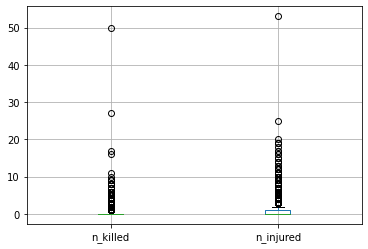

In [ ]:
df.boxplot(column=['n_killed','n_injured'])
plt.show

## Handle column: gun_stolen

Handle column: gun_stolen
1. fill NaN values with Null
*2*. create new bool column: gun_stolen_flag  

In [ ]:
# 1 fill NaN values with null 
df['gun_stolen'] = df['gun_stolen'].fillna('Null')

# 2 create new bool column: gun_stolen_flag 
df['gun_stolen_flag'] = df['gun_stolen'].str.contains('Stolen')

df.gun_stolen_flag.value_counts()

#df['n_killed'].value_counts().plot.barh()

False    232320
True       7357
Name: gun_stolen_flag, dtype: int64

In [ ]:
df.groupby(['gun_stolen_flag']).agg({'n_killed': 'sum','n_injured': ['sum'\
                                     ,'count']})
                                     #,'n_injured': 'count']})

n_killed n_injured        
                     sum       sum   count
gun_stolen_flag                           
False              60163    117828  232320
True                 305       574    7357

## Create new columns:

## Is Fatal Flag

In [ ]:
df['is_fatal_flag'] = df['n_killed'].apply(lambda x: 'True' if x > 0 else 'False')

## Gun stolen Falg

In [ ]:
# 1 fill NaN values with null 
df['gun_stolen'] = df['gun_stolen'].fillna('Null')

# 2 create new bool column: gun_stolen_flag 
df['gun_stolen_flag'] = df['gun_stolen'].str.contains('Stolen')

df.gun_stolen_flag.value_counts()

False    232320
True       7357
Name: gun_stolen_flag, dtype: int64

# As we see stolen gun and NOT fatal result are correlated:

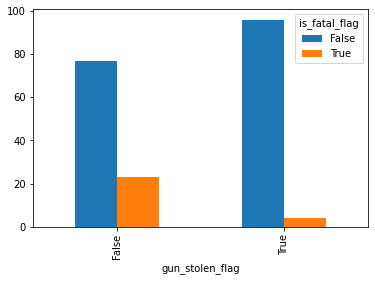

In [ ]:
df_stolen_fatal = df.groupby(['gun_stolen_flag','is_fatal_flag']).size()
df_stolen_fatal.groupby(level=0).apply(lambda x:
                                                 round(100 * x / float(x.sum()),0)).unstack().plot.bar()

# Number of Male / Female

In [ ]:
def count_by_gender(text, gender):
  gender_num = text.count(gender)
  return gender_num

In [ ]:
#df.participant_gender.value_counts(dropna=False)
df.participant_gender.isna().sum() # 36,362

# For a single column using Pandas:
df['participant_gender'] = df['participant_gender'].fillna('Null') #'null' , 0
#df.participant_gender.value_counts() #normalize=True)

In [ ]:
df['count_male'] = df.participant_gender.apply(lambda x: count_by_gender(x,'Male'))
df['count_female'] = df.participant_gender.apply(lambda x: count_by_gender(x,'Female'))

In [ ]:
df.count_female.value_counts()

0     201985
1      33295
2       3641
3        579
4        119
5         31
6         15
8          3
7          3
23         1
18         1
17         1
13         1
11         1
10         1
Name: count_female, dtype: int64

# Time and seasonality  

## Create time columns:
* Date
* Month Name
* Month Number
* Year

In [ ]:
df['date']= pd.to_datetime(df['date']) 
df['month_name'] = df['date'].dt.month_name()

df["monthNum"] = df["month_name"].replace({
    "January": 1, "February": 2, "March": 3, "April": 4,
     "May": 5, "June": 6, "July": 7, "August":8, "September":9, "October":10
     , "November":11, "December":12 })

df['year'], df['month'] = df['date'].dt.year, df['date'].dt.month


## Year Analysis

Text(0, 0.5, 'casualties')

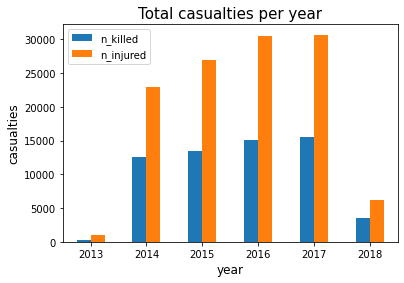

In [ ]:
# Total casualties per year

df['date'] = pd.to_datetime(df['date'])

df['year'], df['month'] = df['date'].dt.year, df['date'].dt.month
year = df.groupby(df.year)

per_year = df.groupby(['year']).sum()
per_year.plot(y=["n_killed", "n_injured"], kind="bar")

plt.title("Total casualties per year",fontsize=15)
plt.xticks(rotation=0)
plt.xlabel('year',fontsize=12)
plt.ylabel('casualties',fontsize=12)


In the last graph we noticed that data is missing in 2013 and 2018 and therefore we will use the information from 2014 to 2018 for any use of data that is critical

In [ ]:
df_full_year_only = df[(df['year'] >= 2014) & (df['year'] <= 2017)]

## Season Analsis

Text(0, 0.5, 'casualties')

<Figure size 432x288 with 0 Axes>

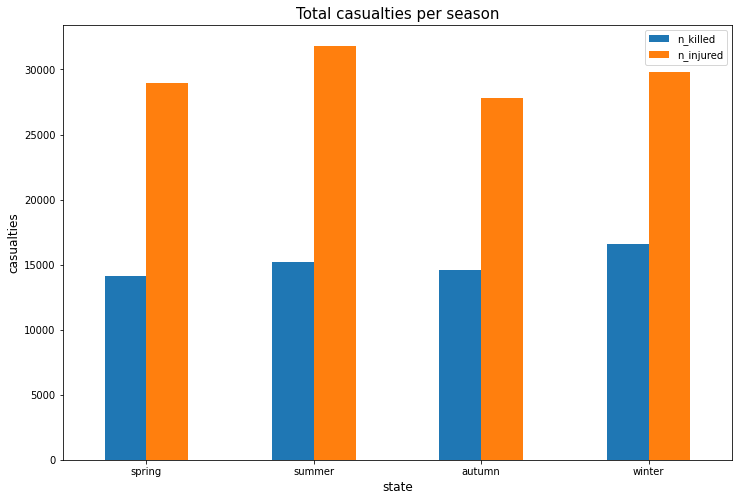

In [ ]:
# Total casualties per season

fig = plt.figure()

df['date']= pd.to_datetime(df['date']) 
df['month_name'] = df['date'].dt.month_name()
df['dayofweek_name'] = df['date'].dt.day_name()

df["monthNum"] = df["month_name"].replace({
    "January": 1, "February": 2, "March": 3, "April": 4,
     "May": 5, "June": 6, "July": 7, "August":8, "September":9, "October":10
     , "November":11, "December":12 })

df["DayNum"] = df["dayofweek_name"].replace({
    "Monday": 1, "Tuesday": 2, "Wednesday": 3, "Thursday": 4,
     "Friday": 5, "Saturday": 6, "Sunday": 7 })

df['date_offset'] = (df['monthNum']*100 + df['DayNum'] - 320) % 1300

df['season'] = pd.cut(df['date_offset'], [0, 300, 602, 900, 1300], 
                      labels=['spring', 'summer', 'autumn', 'winter'])


per_season = df.groupby(['season']).sum()
per_season.plot(y=["n_killed", "n_injured"], kind="bar",figsize=(12,8))

plt.title("Total casualties per season",fontsize=15)
plt.xticks(rotation=0)
plt.xlabel('state',fontsize=12)
plt.ylabel('casualties',fontsize=12)


# Month Analysis

Text(0, 0.5, 'casualties')

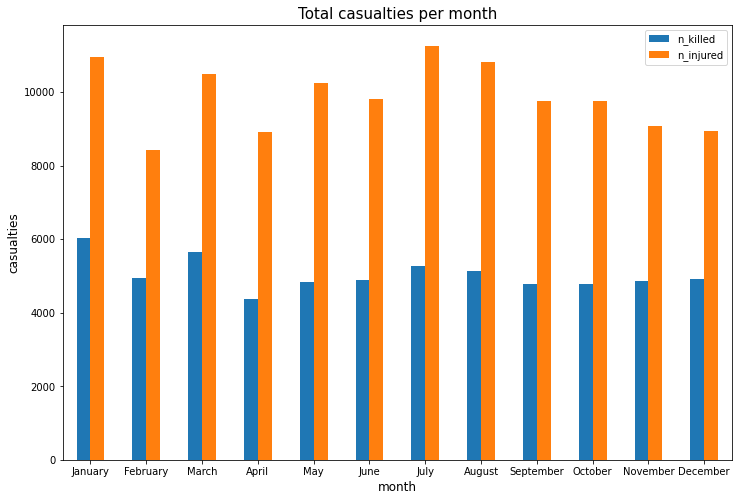

In [ ]:
# Which month is the most dangerous in 

df['date']= pd.to_datetime(df['date']) 
df['month_name'] = df['date'].dt.month_name()


df["monthNum"] = df["month_name"].replace({
    "January": 1, "February": 2, "March": 3, "April": 4,
     "May": 5, "June": 6, "July": 7, "August":8, "September":9, "October":10
     , "November":11, "December":12 })

per_month = df.groupby(['monthNum']).sum()
per_month.plot(y=["n_killed", "n_injured"], kind="bar",figsize=(12,8))\
      .set_xticklabels(("January", "February", "March", "April", "May",
      "June", "July", "August", "September","October",
      "November", "December"),fontsize=10)

plt.title("Total casualties per month",fontsize=15)
plt.xticks(rotation=0)
plt.xlabel('month',fontsize=12)
plt.ylabel('casualties',fontsize=12)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

Text(0, 0.5, 'casualties')

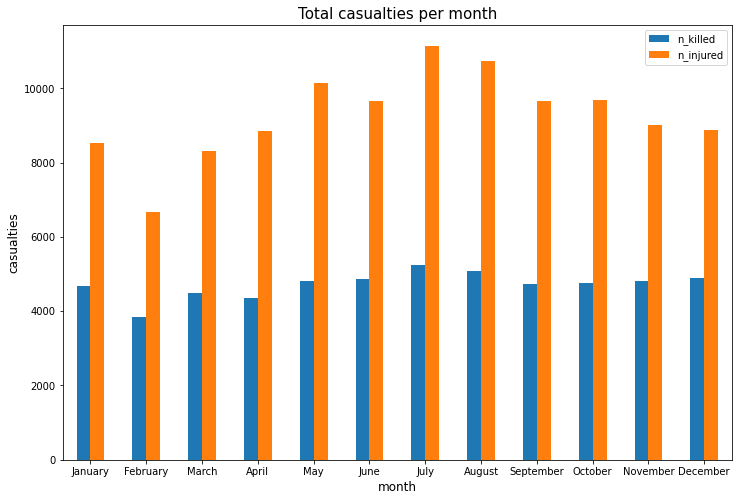

In [ ]:
# Which month without 2013 and 2018 is the most dangerous in 

df_full_year_only['date']= pd.to_datetime(df_full_year_only['date']) 
df_full_year_only['month_name'] = df_full_year_only['date'].dt.month_name()


df_full_year_only["monthNum"] = df_full_year_only["month_name"].replace({
    "January": 1, "February": 2, "March": 3, "April": 4,
     "May": 5, "June": 6, "July": 7, "August":8, "September":9, "October":10
     , "November":11, "December":12 })

per_month_full = df_full_year_only.groupby(['monthNum']).sum()
per_month_full.plot(y=["n_killed", "n_injured"], kind="bar",figsize=(12,8))\
      .set_xticklabels(("January", "February", "March", "April", "May",
      "June", "July", "August", "September","October",
      "November", "December"),fontsize=10)

plt.title("Total casualties per month",fontsize=15)
plt.xticks(rotation=0)
plt.xlabel('month',fontsize=12)
plt.ylabel('casualties',fontsize=12)

## Day Analsis

Text(0, 0.5, 'casualties')

<Figure size 432x288 with 0 Axes>

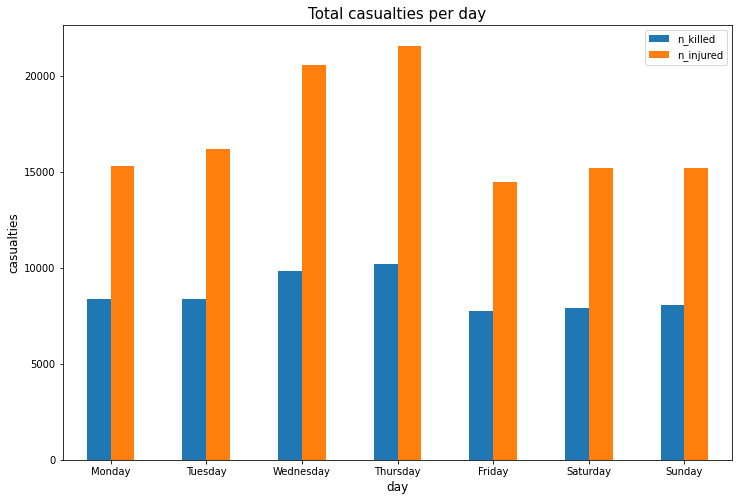

In [ ]:
# Which day is the most dangerous in usa territories

fig = plt.figure()

df['date']= pd.to_datetime(df['date']) 
df['dayofweek_name'] = df['date'].dt.day_name()

df["DayNum"] = df["dayofweek_name"].replace({
    "Monday": 1, "Tuesday": 2, "Wednesday": 3, "Thursday": 4,
     "Friday": 5, "Saturday": 6, "Sunday": 7 })


per_day = df.groupby(['dayofweek_name']).sum()
per_day.plot(y=["n_killed", "n_injured"], kind="bar",figsize=(12,8))\
      .set_xticklabels(["Monday", "Tuesday", "Wednesday", "Thursday",
      "Friday", "Saturday", "Sunday"],fontsize=10)


plt.title("Total casualties per day",fontsize=15)
plt.xticks(rotation=0)
plt.xlabel('day',fontsize=12)
plt.ylabel('casualties',fontsize=12)


# Map Visualization

In [ ]:

is_casualties_notClean = df[df['n_killed'] > 0].append(df[df['n_injured'] > 0])
is_casualties = is_casualties_notClean.drop_duplicates()

is_casualties['text'] =  is_casualties['state'] +', '+\
is_casualties['city_or_county'] +' '+'killed: '+\
is_casualties['n_killed'].astype(str) + '\n injured: ' +\
 is_casualties['n_injured'].astype(str)

fig = go.Figure(data=go.Scattergeo(
        lon = is_casualties['longitude'],
        lat = is_casualties['latitude'],
        text = is_casualties['text'],
        mode = 'markers',
        marker_color = is_casualties['n_killed']
        ))

fig.update_layout(
        title = 'casualties per state in USA Map<br>(Hover for more data)',
        geo_scope='usa',
    )
fig.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Casualties per US state

Text(0, 0.5, 'casualties')

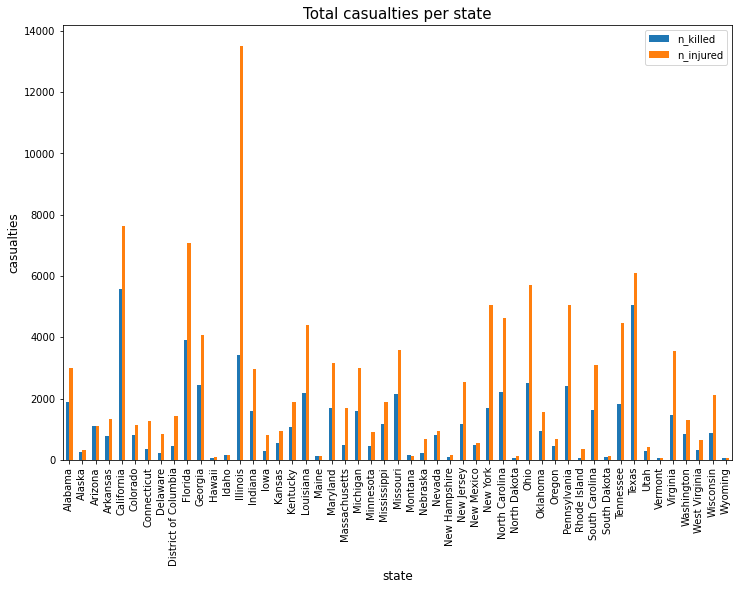

In [ ]:
# total casualties per state

per_year = df.groupby(['state']).sum()
per_year.plot(y=["n_killed", "n_injured"], kind="bar",figsize=(12,8))

plt.title("Total casualties per state",fontsize=15)
plt.xlabel('state',fontsize=12)
plt.ylabel('casualties',fontsize=12)

Elad Addtion 8 April:

# Gender analysis

## Create column Gander:

In [ ]:
df.participant_gender.value_counts(dropna=False)
df.participant_gender

0                0::Male||1::Male||3::Male||4::Female
1                                             0::Male
2         0::Male||1::Male||2::Male||3::Male||4::Male
3                0::Female||1::Male||2::Male||3::Male
4              0::Female||1::Male||2::Male||3::Female
                             ...                     
239672                                      0::Female
239673                               0::Male||1::Male
239674                                        0::Male
239675                                        0::Male
239676                             0::Female||1::Male
Name: participant_gender, Length: 239677, dtype: object

In [ ]:
df.participant_gender.value_counts(dropna=False)
df.participant_gender.isna().sum()

# For a single column using Pandas:
#df['participant_gender'] = df['participant_gender'].fillna('Null') #'null' , 0
# df.participant_gender.value_counts() #normalize=True)

0

In [ ]:
df.participant_gender.value_counts(normalize=True)

0::Male                                                                             0.390092
0::Male||1::Male                                                                    0.181619
Null                                                                                0.151713
0::Male||1::Male||2::Male                                                           0.051665
0::Female||1::Male                                                                  0.044235
                                                                                      ...   
0::Male||5::Male||6::Male||7::Female||8::Male||9::Male                              0.000004
0::Male||1::Male||2::Male||3::Male||5::Male||6::Male||7::Male||8::Male              0.000004
0::Male||2::Male||3::Female||4::Female||5::Female||6::Male||7::Male                 0.000004
0::Male||1::Female||2::Female||3::Male||4::Female||5::Female||6::Female||7::Male    0.000004
0::Male||1::Female||2::Female||3::Male||4::Female||5::Female||6::Male 

In [ ]:
# df[(df.number_of_participants == 0)].head()

In [ ]:
df.participant_gender.isna().sum()

0

In [ ]:
df['number_of_participants'] = df.participant_gender.str.count("ale")
df['number_of_males'] = df.participant_gender.str.count("Male")
df['number_of_famales'] = df.participant_gender.str.count("Female")
df['is_famale'] = df['number_of_famales'] .apply(lambda x: 'Female' if x >= 1 else 'Not Female')

## Are Man more Fatal? 
yes.

In [ ]:
#df[(df['col_name'].str.contains('apple')) & (df['col_name'].str.contains('banana'))]
df['count_female'].apply(lambda x: 'Female' if x >= 1 else 'Not Female').value_counts(normalize=True)

Not Female    0.842738
Female        0.157262
Name: count_female, dtype: float64

Incident with famale are more fatal:

In [ ]:
df['is_female'] = df['count_female'].apply(lambda x: 'Female' if x >= 1 else 'Not Female')

In [ ]:
df_famale_fatal = df.groupby(['is_female','is_fatal_flag']).size()

In [ ]:
df_famale_fatal.groupby(level=0).apply(lambda x:
                                                 round(100 * x / float(x.sum()),0)).unstack()

is_fatal_flag,False,True
is_female,,
Female,68.0,32.0
Not Female,79.0,21.0


when female are involved, there are more fatality cases

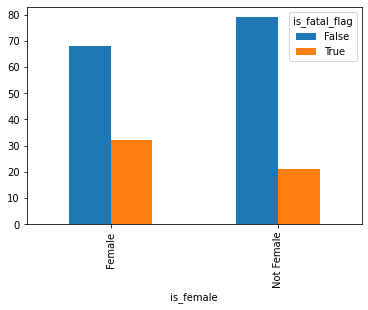

In [ ]:
df_famale_fatal = df.groupby(['is_female','is_fatal_flag']).size()
df_famale_fatal.groupby(level=0).apply(lambda x:
                                                 round(100 * x / float(x.sum()),0)).unstack().plot.bar()

# Clean gun type column

In [ ]:
#before:
df.gun_type.value_counts()

0::Unknown                                                                                                                    93559
0::Handgun                                                                                                                    13018
0::9mm                                                                                                                         4599
0::Unknown||1::Unknown                                                                                                         2410
0::22 LR                                                                                                                       2193
                                                                                                                              ...  
0::22 LR||1::38 Spl||2::Handgun||3::Rifle                                                                                         1
0::Shotgun||1::Rifle||2::Rifle||3::Rifle||4::Rifle||5::Rifle||6::Rifle||7::R

In [ ]:
df.gun_type.value_counts(dropna=False)
df.gun_type.isna().sum()

# For a single column using Pandas:
df['gun_type'] = df['gun_type'].fillna('Null') #'null' , 0
df.gun_type.value_counts() #normalize=True)

Null                                                                                                                          99451
0::Unknown                                                                                                                    93559
0::Handgun                                                                                                                    13018
0::9mm                                                                                                                         4599
0::Unknown||1::Unknown                                                                                                         2410
                                                                                                                              ...  
0::22 LR||1::38 Spl||2::Handgun||3::Rifle                                                                                         1
0::Shotgun||1::Rifle||2::Rifle||3::Rifle||4::Rifle||5::Rifle||6::Rifle||7::R

In [ ]:
def remove_dup3(text):
  text = re.sub(r'Unknown', '', text)
  text = re.sub(r'^[0-9]', '', text)
  text = text.replace('|', '')
  text = text.split('''::''')
  text = list(dict.fromkeys(text))
  text = ''.join(text)
  return text

In [ ]:
df['gun_type_clean'] = df.gun_type.apply(lambda x: remove_dup3(str(x)))

As we can See, girls prefere Handgun, 9mm and Shotgun:

In [ ]:
df[(df['is_female'] == 'Female')\
   & (df.gun_type_clean != 'Null')\
   ].gun_type_clean.value_counts().nlargest(10)

                   14194
Handgun             2307
9mm                  613
Shotgun              398
1                    378
22 LR                372
Rifle                273
Handgun1Handgun      237
40 SW                235
45 Auto              194
Name: gun_type_clean, dtype: int64

In [ ]:
df[(df['is_female'] != 'Female')\
   & (df.gun_type_clean != 'Null')\
   ].gun_type_clean.value_counts().nlargest(10)

            79365
Handgun     10711
9mm          3986
1            2032
22 LR        1821
Shotgun      1753
40 SW        1712
380 Auto     1660
45 Auto      1343
Rifle        1249
Name: gun_type_clean, dtype: int64

# Create cause column 
Version 1

In [ ]:
df.participant_relationship.value_counts()

1::Significant others - current or former                                                                                                                                                                                             2651
1::Family                                                                                                                                                                                                                             2573
1::Armed Robbery                                                                                                                                                                                                                      1874
1::Armed Robbery||2::Armed Robbery                                                                                                                                                                                                    1100
1::Friends                                                  

In [ ]:
def remove_dup(text):
  text = re.sub(r'[0-9]', '', text)
  text = text.replace('|', '')
  text = text.split('''::''')
  text = list(dict.fromkeys(text))
  text = ''.join(text)
  return text

In [ ]:
def remove_dup2(text):
  text = re.sub(r'[0-9]', '', text)
  text = text.replace('|', '')
  text = text.split('''::''')
  text = list(dict.fromkeys(text))
  text = ''.join(text)
  return text

In [ ]:
df.participant_relationship = df.participant_relationship.fillna('Null') #'null' , 0

In [ ]:
df['cause'] = df.participant_relationship.apply(lambda x: remove_dup(str(x))) #.value_counts()

In [ ]:
df_with_cause = df[df.cause != 'Null']

As we can see, from the cause column, Famaly is the most Fatal (where there is cause data (not nan))

## cause column anlysis

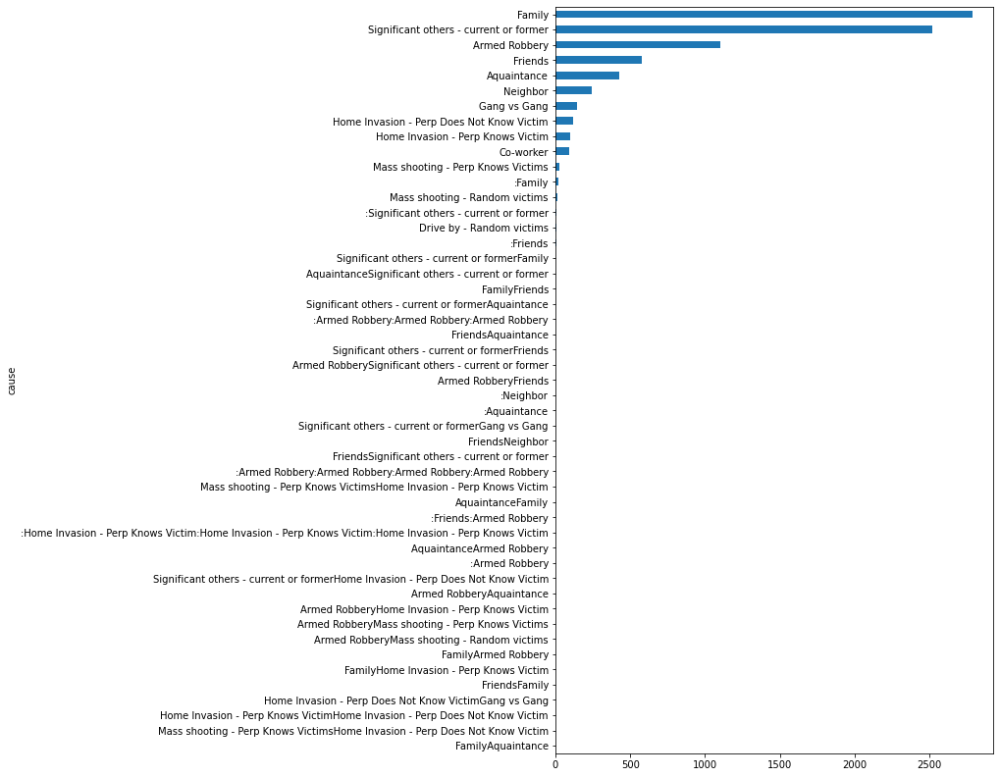

In [ ]:
df_with_cause.groupby(['cause']).n_killed.sum().sort_values(ascending=True).plot.barh(figsize=(8,14))

In [ ]:
df_with_cause.groupby(['cause']).n_killed.sum().sort_values(ascending=False).nlargest(10)

cause
Family                                       2787
Significant others - current or former       2519
Armed Robbery                                1101
Friends                                       578
Aquaintance                                   425
Neighbor                                      240
Gang vs Gang                                  142
Home Invasion - Perp Does Not Know Victim     121
Home Invasion - Perp Knows Victim              97
Co-worker                                      90
Name: n_killed, dtype: int64

In [ ]:
df_with_cause.groupby(['monthNum','cause']).n_killed.sum().sort_values(ascending=False).nlargest(100)

monthNum  cause                                    
2         Family                                       298
12        Family                                       282
1         Family                                       277
3         Family                                       263
          Significant others - current or former       242
                                                      ... 
2         Home Invasion - Perp Knows Victim             10
3         :Significant others - current or former       10
7         Home Invasion - Perp Does Not Know Victim      9
9         Home Invasion - Perp Does Not Know Victim      9
4         Gang vs Gang                                   9
Name: n_killed, Length: 100, dtype: int64

In [ ]:
df[df['cause'] == 'Family'].\
groupby(['monthNum']).agg({'n_killed': 'sum','n_injured': 'sum'})

,n_killed,n_injured
monthNum,,
1,277,157
2,298,141
3,263,158
4,242,111
5,196,120
6,175,99
7,242,126
8,193,100
9,205,107


Total casualties per month due Family cause

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text major ticklabel objects>)

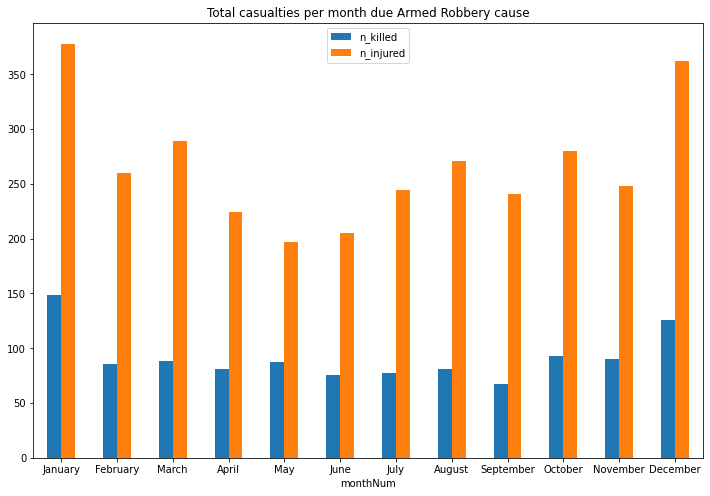

In [ ]:
#  Total casualties per month due Armed Robbery cause
cause_armedRobbery_perMonth= df[df['cause'] == 'Armed Robbery'].\
groupby(['monthNum']).agg({'n_killed': 'sum','n_injured': 'sum'})

cause_armedRobbery_perMonth.plot(y=["n_killed", "n_injured"], kind="bar",figsize=(12,8))\
      .set_xticklabels(("January", "February", "March", "April", "May",
      "June", "July", "August", "September","October",
      "November", "December"),fontsize=10)
plt.title("Total casualties per month due Armed Robbery cause",fontsize=12)
plt.xticks(rotation=0)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text major ticklabel objects>)

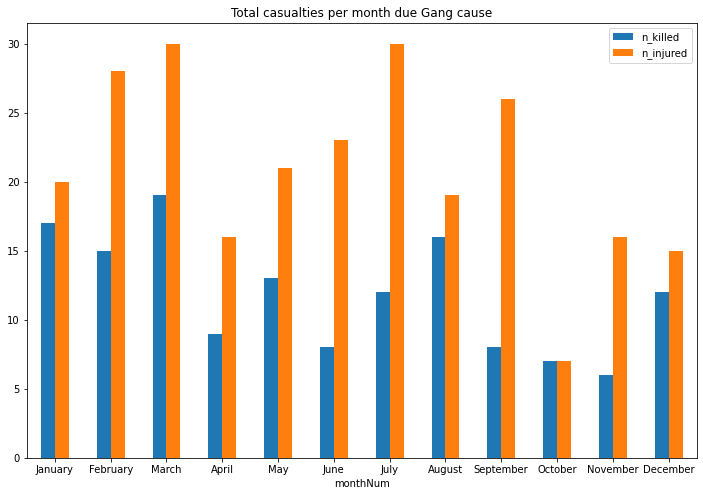

In [ ]:
#  Total casualties per month due Gang cause
cause_Gang_perMonth= df[df['cause'] == 'Gang vs Gang'].\
groupby(['monthNum']).agg({'n_killed': 'sum','n_injured': 'sum'})

cause_Gang_perMonth.plot(y=["n_killed", "n_injured"], kind="bar",figsize=(12,8))\
      .set_xticklabels(("January", "February", "March", "April", "May",
      "June", "July", "August", "September","October",
      "November", "December"),fontsize=10)
plt.title("Total casualties per month due Gang cause",fontsize=12)
plt.xticks(rotation=0)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text major ticklabel objects>)

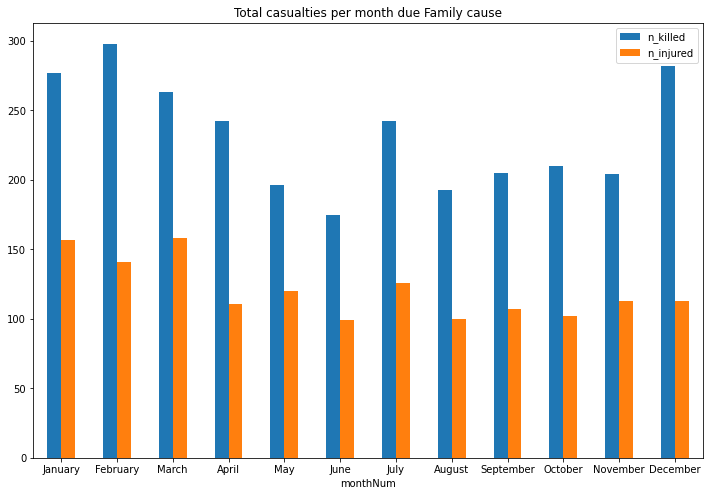

In [ ]:
# Total casualties per month due Family cause
cause_family_perMonth = df[df['cause'] == 'Family'].groupby(['monthNum'])\
.agg({'n_killed': 'sum','n_injured': 'sum'})

cause_family_perMonth.plot(y=["n_killed", "n_injured"], kind="bar",figsize=(12,8))\
      .set_xticklabels(("January", "February", "March", "April", "May",
      "June", "July", "August", "September","October",
      "November", "December"),fontsize=10)

plt.title("Total casualties per month due Family cause",fontsize=12)
plt.xticks(rotation=0)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text major ticklabel objects>)

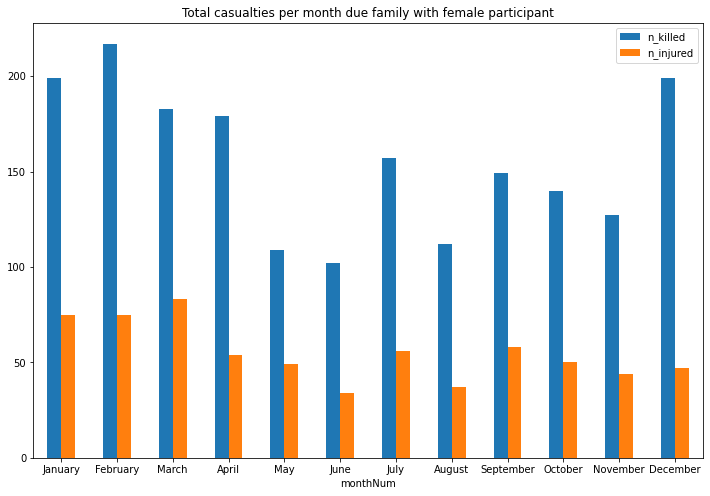

In [ ]:
# Total casualties per month due family with female participant
cause_family_F_perMonth= df[(df['cause'] == 'Family') & (df['is_female'] == 'Female')].\
groupby(['monthNum']).agg({'n_killed': 'sum','n_injured': 'sum'})
                                                                                                
cause_family_F_perMonth.plot(y=["n_killed", "n_injured"], kind="bar",figsize=(12,8))\
      .set_xticklabels(("January", "February", "March", "April", "May",
      "June", "July", "August", "September","October",
      "November", "December"),fontsize=10)
plt.title("Total casualties per month due family with female participant",fontsize=12)
plt.xticks(rotation=0)

In [ ]:
df[df['cause'] == 'Armed Robbery'].\
groupby(['monthNum']).agg({'n_killed': 'sum','n_injured': 'sum'})

,n_killed,n_injured
monthNum,,
1,149,378
2,86,260
3,88,289
4,81,224
5,87,197
6,76,205
7,77,244
8,81,271
9,67,241


In [ ]:
df[df['cause'] == 'Gang vs Gang'].\
groupby(['monthNum']).agg({'n_killed': 'sum','n_injured': 'sum'})

,n_killed,n_injured
monthNum,,
1,17,20
2,15,28
3,19,30
4,9,16
5,13,21
6,8,23
7,12,30
8,16,19
9,8,26


In [ ]:
df[df['cause'] == 'Aquaintance'].\
groupby(['monthNum']).agg({'n_killed': 'sum','n_injured': 'sum'})

,n_killed,n_injured
monthNum,,
1,37,51
2,28,29
3,35,36
4,25,42
5,41,41
6,42,67
7,39,65
8,43,45
9,30,27


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text major ticklabel objects>)

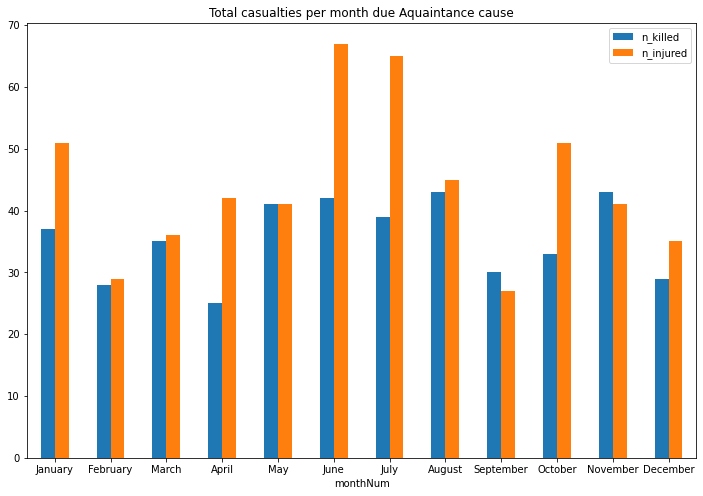

In [ ]:
# Total casualties per month due Aquaintance cause
cause_Aquaintance_perMonth= df[df['cause'] == 'Aquaintance'].\
groupby(['monthNum']).agg({'n_killed': 'sum','n_injured': 'sum'})
                                                                                                
cause_Aquaintance_perMonth.plot(y=["n_killed", "n_injured"], kind="bar",figsize=(12,8))\
      .set_xticklabels(("January", "February", "March", "April", "May",
      "June", "July", "August", "September","October",
      "November", "December"),fontsize=10)
plt.title("Total casualties per month due Aquaintance cause",fontsize=12)
plt.xticks(rotation=0)

In [ ]:
df.columns

Index(['date', 'state', 'city_or_county', 'n_killed', 'n_injured',
       'gun_stolen', 'gun_type', 'incident_characteristics', 'latitude',
       'longitude', 'n_guns_involved', 'notes', 'participant_age',
       'participant_age_group', 'participant_gender', 'participant_name',
       'participant_relationship', 'participant_status', 'participant_type',
       'gun_stolen_flag', 'is_fatal_flag', 'count_male', 'count_female',
       'month_name', 'monthNum', 'year', 'month', 'dayofweek_name', 'DayNum',
       'date_offset', 'season', 'number_of_participants', 'number_of_males',
       'number_of_famales', 'is_famale', 'is_female', 'gun_type_clean',
       'cause'],
      dtype='object')

Added by Elad 9 April:

1. handle NaN in participant_gender

```
# This is formatted as code
```



In [ ]:
df.participant_gender.value_counts(dropna=False)
df.participant_gender.isna().sum()

# For a single column using Pandas:
#df['participant_gender'] = df['participant_gender'].fillna('Null') #'null' , 0
# df.participant_gender.value_counts() #normalize=True)

0

In [ ]:
#df.participant_relationship.value_counts(dropna=False)
#df.participant_relationship.isna().sum()

# For a single column using Pandas:
#df['participant_relationship'] = df['participant_relationship'].fillna('Null') #'null' , 0
df.participant_relationship.value_counts() #normalize=True)

Null                                                                                                                                                                                                                                  223903
1::Significant others - current or former                                                                                                                                                                                               2651
1::Family                                                                                                                                                                                                                               2573
1::Armed Robbery                                                                                                                                                                                                                        1874
1::Armed Robbery||2::Armed Robbery                  

In [ ]:
#n_killed
df.n_killed.value_counts(dropna=False)
#df.n_killed.isna().sum()

# For a single column using Pandas:
#df['n_killed'] = df['n_killed'].fillna(0) #'null' , 0
#df.n_killed.value_counts() #normalize=True)

0     185835
1      48436
2       4604
3        595
4        139
5         41
6         11
8          5
9          3
7          2
50         1
27         1
17         1
16         1
11         1
10         1
Name: n_killed, dtype: int64

In [ ]:
df['cause'] = df.participant_relationship.apply(lambda x: remove_dup(str(x))) #.value_counts()
df['cause'] = df['cause'].fillna('Null')

In [ ]:
def remove_dup2(text):
  male_num = male_5.count("Male")
  female_num = male_5.count("Female")
  return (f'Male={male_num},  Female={female_num}')

# Create Gender column version 2

In [ ]:
df.participant_gender.value_counts()

0::Male                                                                             93496
0::Male||1::Male                                                                    43530
Null                                                                                36362
0::Male||1::Male||2::Male                                                           12383
0::Female||1::Male                                                                  10602
                                                                                    ...  
0::Male||5::Male||6::Male||7::Female||8::Male||9::Male                                  1
0::Male||1::Male||2::Male||3::Male||5::Male||6::Male||7::Male||8::Male                  1
0::Male||2::Male||3::Female||4::Female||5::Female||6::Male||7::Male                     1
0::Male||1::Female||2::Female||3::Male||4::Female||5::Female||6::Female||7::Male        1
0::Male||1::Female||2::Female||3::Male||4::Female||5::Female||6::Male                   1
Name: part

In [ ]:
def count_gender(text):
  male_num = text.count("Male")
  female_num = text.count("Female")
  return (f'Male={male_num},  Female={female_num}')

In [ ]:
def count_by_gender(text, gender):
  gender_num = text.count(gender)
  return gender_num

In [ ]:
df['count_male'] = df.participant_gender.apply(lambda x: count_by_gender(x,'Male'))
df['count_female'] = df.participant_gender.apply(lambda x: count_by_gender(x,'Female'))

In [ ]:
df['count_participant_gender'] = df.participant_gender.apply(lambda x: count_gender(x))

In [ ]:
def count_by_gender(text, gender):
  gender_num = text.count(gender)
  return gender_num

In [ ]:
df.count_participant_gender.value_counts()

Male=1,  Female=0      99643
Male=2,  Female=0      45879
Male=0,  Female=0      36362
Male=1,  Female=1      16331
Male=3,  Female=0      13270
                       ...  
Male=5,  Female=5          1
Male=61,  Female=17        1
Male=16,  Female=4         1
Male=1,  Female=6          1
Male=11,  Female=5         1
Name: count_participant_gender, Length: 113, dtype: int64

In [ ]:
df['count_female'] = df.participant_gender.apply(lambda x: count_by_gender(x,'Female'))

In [ ]:
df['count_male'] = df.participant_gender.apply(lambda x: count_by_gender(x,'Male'))

In [ ]:
df.columns

Index(['date', 'state', 'city_or_county', 'n_killed', 'n_injured',
       'gun_stolen', 'gun_type', 'incident_characteristics', 'latitude',
       'longitude', 'n_guns_involved', 'notes', 'participant_age',
       'participant_age_group', 'participant_gender', 'participant_name',
       'participant_relationship', 'participant_status', 'participant_type',
       'gun_stolen_flag', 'is_fatal_flag', 'count_male', 'count_female',
       'month_name', 'monthNum', 'year', 'month', 'dayofweek_name', 'DayNum',
       'date_offset', 'season', 'number_of_participants', 'number_of_males',
       'number_of_famales', 'is_famale', 'is_female', 'gun_type_clean',
       'cause', 'count_participant_gender'],
      dtype='object')

In [ ]:
df.is_famale.value_counts()

Not Female    201985
Female         37692
Name: is_famale, dtype: int64

In [ ]:
df.count_female.value_counts()

0     201985
1      33295
2       3641
3        579
4        119
5         31
6         15
8          3
7          3
23         1
18         1
17         1
13         1
11         1
10         1
Name: count_female, dtype: int64

In [ ]:
df.count_male.value_counts()

1     117424
2      52202
0      45541
3      15901
4       5719
5       1877
6        613
7        192
8         84
9         32
10        25
11        16
13        12
12         7
14         7
16         7
15         4
18         3
21         2
26         2
60         1
17         1
19         1
20         1
27         1
29         1
61         1
Name: count_male, dtype: int64

In [ ]:
df.count_male.count()

239677

In [ ]:
df.count_female.count()

239677

In [ ]:
df[df['cause'] == 'Family'].groupby(['cause','monthNum']).agg({'n_killed': 'sum'}).unstack()

n_killed                                                       
monthNum       1    2    3    4    5    6    7    8    9    10   11   12
cause                                                                   
Family        277  298  263  242  196  175  242  193  205  210  204  282

In [ ]:
 df.groupby(['monthNum','is_famale']).agg({'n_killed': 'sum'}).unstack()

n_killed           
is_famale   Female Not Female
monthNum                     
1             1692       4343
2             1539       3406
3             1581       4060
4             1231       3152
5             1251       3579
6             1365       3521
7             1402       3874
8             1361       3766
9             1251       3528
10            1371       3420
11            1315       3533
12            1354       3573

In [ ]:
df[(df['cause'] == 'Family') & (df['is_famale'] == 'Female')]

,date,state,city_or_county,n_killed,n_injured,gun_stolen,gun_type,incident_characteristics,latitude,longitude,n_guns_involved,notes,participant_age,participant_age_group,participant_gender,participant_name,participant_relationship,participant_status,participant_type,gun_stolen_flag,is_fatal_flag,count_male,count_female,month_name,monthNum,year,month,dayofweek_name,DayNum,date_offset,season,number_of_participants,number_of_males,number_of_famales,is_famale,is_female,gun_type_clean,cause,count_participant_gender
4,2013-01-07,North Carolina,Greensboro,2,2,0::Unknown||1::Unknown,0::Handgun||1::Handgun,"Shot - Wounded/Injured||Shot - Dead (murder, a...",36.1140,-79.9569,2.0,Two firearms recovered. (Attempted) murder sui...,0::18||1::46||2::14||3::47,0::Adult 18+||1::Adult 18+||2::Teen 12-17||3::...,0::Female||1::Male||2::Male||3::Female,0::Danielle Imani Jameison||1::Maurice Eugene ...,3::Family,0::Injured||1::Injured||2::Killed||3::Killed,0::Victim||1::Victim||2::Victim||3::Subject-Su...,False,True,2,2,January,1,2013,1,Monday,1,1081,winter,4,2,2,Female,Female,Handgun1Handgun,Family,"Male=2, Female=2"
6,2013-01-19,New Mexico,Albuquerque,5,0,0::Unknown||1::Unknown,0::22 LR||1::223 Rem [AR-15],"Shot - Dead (murder, accidental, suicide)||Mas...",34.9791,-106.7160,2.0,NaN,0::51||1::40||2::9||3::5||4::2||5::15,0::Adult 18+||1::Adult 18+||2::Child 0-11||3::...,0::Male||1::Female||2::Male||3::Female||4::Fem...,0::Greg Griego||1::Sara Griego||2::Zephania Gr...,5::Family,0::Killed||1::Killed||2::Killed||3::Killed||4:...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,False,True,3,3,January,1,2013,1,Saturday,6,1086,winter,6,3,3,Female,Female,22 LR1223 Rem [AR-15],Family,"Male=3, Female=3"
116,2013-06-27,California,Three Rivers,2,2,0::Unknown,0::Unknown,"Shot - Wounded/Injured||Shot - Dead (murder, a...",36.4144,-118.9250,1.0,NaN,0::28||1::29||2::20||3::28||4::21||5::17,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Female||2::Male||3::Male||4::Male|...,0::Manuel Anthony Talamantez||1::Christina Mar...,0::Family,"0::Unharmed, Arrested||1::Unharmed, Arrested||...",0::Subject-Suspect||1::Subject-Suspect||2::Vic...,False,True,5,1,June,6,2013,6,Thursday,4,284,spring,6,5,1,Female,Female,,Family,"Male=5, Female=1"
122,2013-07-01,Texas,Fort Worth,4,0,Null,Null,"Shot - Dead (murder, accidental, suicide)||Mas...",32.7157,-97.2597,NaN,Unborn child killed by shot to the mother's ab...,0::39||1::22||2::10||3::0||4::22,0::Adult 18+||1::Adult 18+||2::Child 0-11||3::...,0::Female||1::Female||2::Male||4::Male,0::Annette Carroll Reed||1::Chanice Renee Reed...,4::Family,0::Killed||1::Killed||2::Killed||3::Killed||4:...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,False,True,2,2,July,7,2013,7,Monday,1,381,summer,4,2,2,Female,Female,Null,Family,"Male=2, Female=2"
137,2013-07-13,Ohio,Campbell,0,4,Null,Null,Shot - Wounded/Injured||Mass Shooting (4+ vict...,41.0738,-80.5997,NaN,NaN,0::62||1::43||2::29||3::24||4::33,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Female||2::Male||3::Female||4::Male,0::Roland Avis||1::Mary Lynette Spann||2::Gera...,4::Family,0::Injured||1::Injured||2::Injured||3::Injured...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,False,False,3,2,July,7,2013,7,Saturday,6,386,summer,5,3,2,Female,Female,Null,Family,"Male=3, Female=2"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239277,2018-03-28,Vermont,Bellows Falls (Rockingham),0,1,0::Unknown,0::Rifle,Non-Shooting Incident||Domestic Violence||Pist...,NaN,NaN,1.0,NaN,1::34,0::Adult 18+||1::Adult 18+,0::Male||1::Female,1::Jillian Taylor,1::Family,"0::Injured||1::Unharmed, Arrested",0::Victim||1::Subject-Suspect,False,False,1,1,March,3,2018,3,Wednesday,3,1283,winter,2,1,1,Female,Female,Rifle,Family,"Male=1, Female=1"
239445,2018-03-30,Pennsylvania,Croydon,1,1,0::Stolen||1::Stolen,0::380 Auto||1::9mm,"Shot - Wounded/Injured||Shot - Dead (murder, a

# Seasonallity in differant causes:

In [ ]:
df_with_cause.groupby(['monthNum','cause']).agg({'n_killed': 'sum'}).unstack()

n_killed  ...                                                                                
cause    :Aquaintance  ... Significant others - current or formerHome Invasion - Perp Does Not Know Victim
monthNum               ...                                                                                
1                 NaN  ...                                                NaN                             
2                 NaN  ...                                                NaN                             
3                 1.0  ...                                                0.0                             
4                 NaN  ...                                                NaN                             
5                 NaN  ...                                                NaN                             
6                 NaN  ...                                                NaN                             
7                 NaN  ...                                                NaN                             
8                 NaN  ...                                                NaN                             
9                 NaN  ...                                                NaN                             
10                NaN  ...                                                NaN                             
11                NaN  ...                                                NaN                             
12                NaN  ...                                                NaN                             

[12 rows x 49 columns]

In [ ]:
df[df['cause'] == 'Family'].groupby(['cause','monthNum']).agg({'n_killed': 'sum'}).unstack()

n_killed                                                       
monthNum       1    2    3    4    5    6    7    8    9    10   11   12
cause                                                                   
Family        277  298  263  242  196  175  242  193  205  210  204  282

In [ ]:
df[df['cause'] != 'Null'].groupby(['cause','monthNum']).agg({'n_killed': 'sum'}).unstack()

n_killed  ...       
monthNum                                                 1   ...     12
cause                                                        ...       
:Aquaintance                                            NaN  ...    NaN
:Armed Robbery                                          NaN  ...    NaN
:Armed Robbery:Armed Robbery:Armed Robbery              NaN  ...    NaN
:Armed Robbery:Armed Robbery:Armed Robbery:Arme...      NaN  ...    NaN
:Family                                                 NaN  ...    NaN
:Friends                                                NaN  ...    NaN
:Friends:Armed Robbery                                  NaN  ...    NaN
:Home Invasion - Perp Knows Victim:Home Invasio...      NaN  ...    NaN
:Neighbor                                               NaN  ...    NaN
:Significant others - current or former                 NaN  ...    NaN
Aquaintance                                            37.0  ...   29.0
AquaintanceArmed Robbery                                NaN  ...    NaN
AquaintanceFamily                                       NaN  ...    NaN
AquaintanceSignificant others - current or former       1.0  ...    NaN
Armed Robbery                                         149.0  ...  126.0
Armed RobberyAquaintance                                NaN  ...    NaN
Armed RobberyFriends                                    NaN  ...    NaN
Armed RobberyHome Invasion - Perp Knows Victim          NaN  ...    NaN
Armed RobberyMass shooting - Perp Knows Victims         NaN  ...    NaN
Armed RobberyMass shooting - Random victims             NaN  ...    NaN
Armed RobberySignificant others - current or fo...      1.0  ...    NaN
Co-worker                                              12.0  ...   11.0
Drive by - Random victims                               1.0  ...    0.0
Family                                                277.0  ...  282.0
FamilyAquaintance                                       NaN  ...    NaN
FamilyArmed Robbery                                     NaN  ...    0.0
FamilyFriends                                           NaN  ...    NaN
FamilyHome Invasion - Perp Knows Victim                 NaN  ...    NaN
Friends                                                77.0  ...   72.0
FriendsAquaintance                                      NaN  ...    NaN
FriendsFamily                                           0.0  ...    NaN
FriendsNeighbor                                         NaN  ...    NaN
FriendsSignificant others - current or former           NaN  ...    NaN
Gang vs Gang                                           17.0  ...   12.0
Home Invasion - Perp Does Not Know Victim              13.0  ...   18.0
Home Invasion - Perp Does Not Know VictimGang v...      NaN  ...    NaN
Home Invasion - Perp Knows Victim                      16.0  ...   17.0
Home Invasion - Perp Knows VictimHome Invasion ...      0.0  ...    0.0
Mass shooting - Perp Knows Victims                      3.0  ...    NaN
Mass shooting - Perp Knows VictimsHome Invasion...      0.0  ...    NaN
Mass shooting - Perp Knows VictimsHome Invasion...      NaN  ...    NaN
Mass shooting - Random victims                          5.0  ...    4.0
Neighbor                                               13.0  ...   15.0
Significant others - current or former                220.0  ...  235.0
Significant others - current or formerAquaintance       NaN  ...    NaN
Significant others - current or formerFamily            NaN  ...    NaN
Significant others - current or formerFriends           NaN  ...    NaN
Significant others - current or formerGang vs Gang      NaN  ...    NaN
Significant others - current or formerHome Inva...      NaN  ...    NaN

[49 rows x 12 columns]

Seasonallity in Armed Robbery

In [ ]:
df.notes.value_counts().head(20)#dropna=False)

man shot                            501
1 inj.                              485
1 killed.                           468
Male shot wounded                   396
shot in leg                         349
1mv                                 332
1mvk                                266
shot multiple times                 256
Male shot killed                    251
ar                                  210
9mm                                 187
1 male shot - wounded               172
380 caliber                         172
Car-jacking.                        160
1 inj                               152
1 inj. This story is developing.    151
1 male victim shot - killed         139
1 killed                            132
shots fired                         128
shot and wounded                    117
Name: notes, dtype: int64

In [ ]:
df.incident_characteristics.value_counts().head(20)#dropna=False)

Shot - Wounded/Injured                                                                                                                                                                    47541
Shot - Dead (murder, accidental, suicide)                                                                                                                                                 23019
Shots Fired - No Injuries                                                                                                                                                                 15690
Shot - Wounded/Injured||Drive-by (car to street, car to car)                                                                                                                               5121
Armed robbery with injury/death and/or evidence of DGU found                                                                                                                               3438
Shot - Wounded/Injured||Shot - Dead (mur

Family and Famale Death:

In [ ]:
df.cause.value_counts()

Null                                                                                                      223903
Armed Robbery                                                                                               4691
Family                                                                                                      3459
Significant others - current or former                                                                      3442
Friends                                                                                                     1033
Aquaintance                                                                                                  931
Neighbor                                                                                                     700
Home Invasion - Perp Does Not Know Victim                                                                    675
Gang vs Gang                                                                                    

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text major ticklabel objects>)

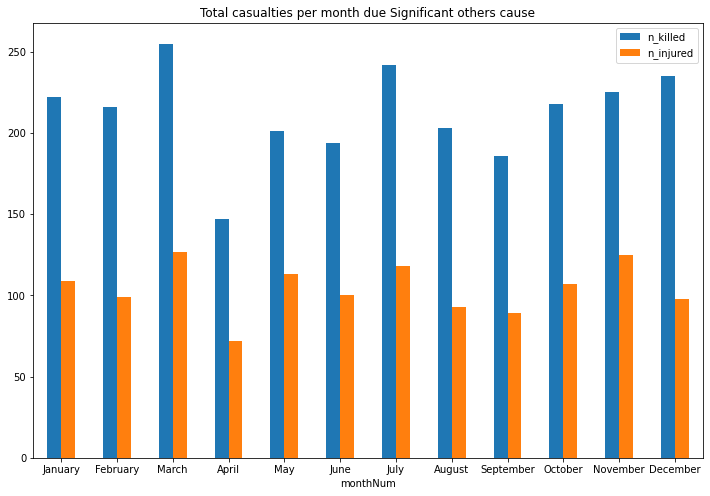

In [ ]:
# Total casualties per month due Significant others cause
cause_Significant_others_perMonth = df[df['cause'].str.contains('Significant others')].groupby(['monthNum'])\
.agg({'n_killed': 'sum','n_injured': 'sum'})

cause_Significant_others_perMonth.plot(y=["n_killed", "n_injured"], kind="bar",figsize=(12,8))\
      .set_xticklabels(("January", "February", "March", "April", "May",
      "June", "July", "August", "September","October",
      "November", "December"),fontsize=10)

plt.title("Total casualties per month due Significant others cause",fontsize=12)
plt.xticks(rotation=0)

In [ ]:
df['characteristics'] = df.incident_characteristics.apply(lambda x: remove_dup(str(x))) #.value_counts()
df['characteristics'] = df['characteristics'].fillna('Null')

In [ ]:
df.characteristics.value_counts()

Shot - Wounded/Injured                                                                                                                                                                                                                                                                                                                                                                                                47541
Shot - Dead (murder, accidental, suicide)                                                                                                                                                                                                                                                                                                                                                                             23019
Shots Fired - No Injuries                                                                                                                                                       

In [ ]:
df.characteristics.str.contains('Officer Involved Shooting').value_counts()

False    225627
True      14050
Name: characteristics, dtype: int64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text major ticklabel objects>)

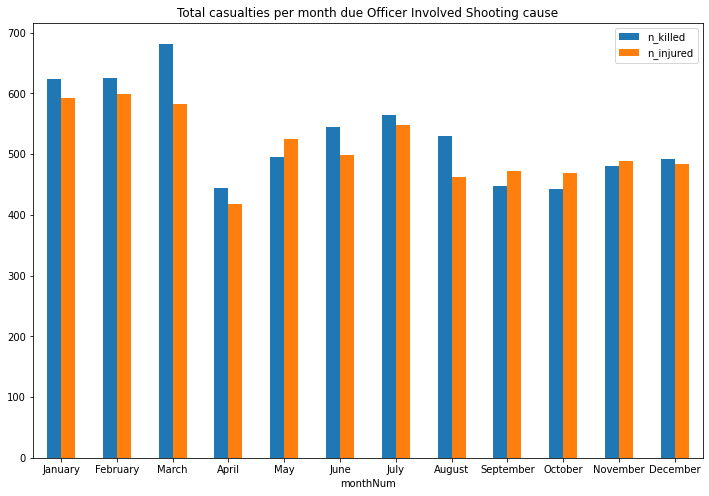

In [ ]:
# Total casualties per month due Officer involved shooting 
cause_Officer_perMonth = df[df['characteristics'].str.contains\
                                       ('Officer Involved Shooting')].groupby(['monthNum'])\
.agg({'n_killed': 'sum','n_injured': 'sum'})


cause_Officer_perMonth.plot(y=["n_killed", "n_injured"], kind="bar",figsize=(12,8))\
      .set_xticklabels(("January", "February", "March", "April", "May",
      "June", "July", "August", "September","October",
      "November", "December"),fontsize=10)

plt.title("Total casualties per month due Officer Involved Shooting cause",fontsize=12)
plt.xticks(rotation=0)

Text(0.5, 1.0, 'perctenge per state due Officer Involved Shooting cause')

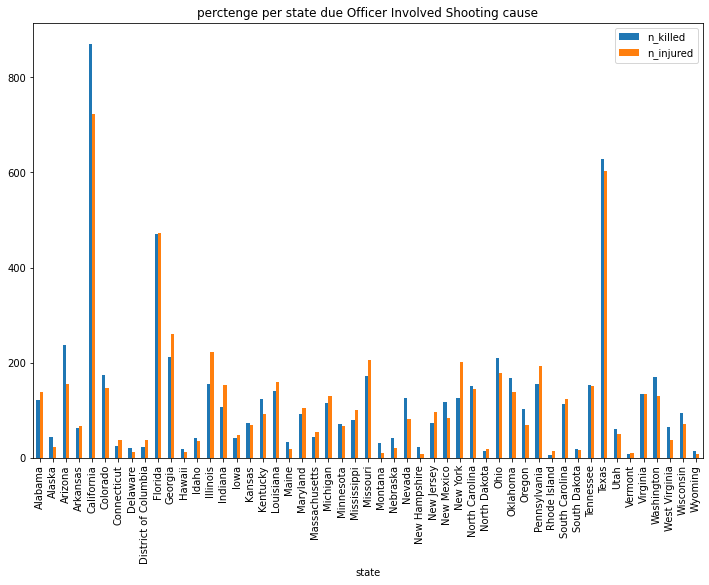

In [ ]:
# Total casualties per state due Officer involved shooting 
cause_Officer_perState = df[df['characteristics'].str.contains\
                                       ('Officer Involved Shooting')].groupby(['state'])\
.agg({'n_killed': 'sum','n_injured': 'sum'})

cause_Officer_perState.plot(y=["n_killed", "n_injured"], kind="bar",figsize=(12,8))

plt.title("perctenge per state due Officer Involved Shooting cause",fontsize=12)

Text(0.5, 1.0, 'perctenge per state due Officer Involved Shooting cause')

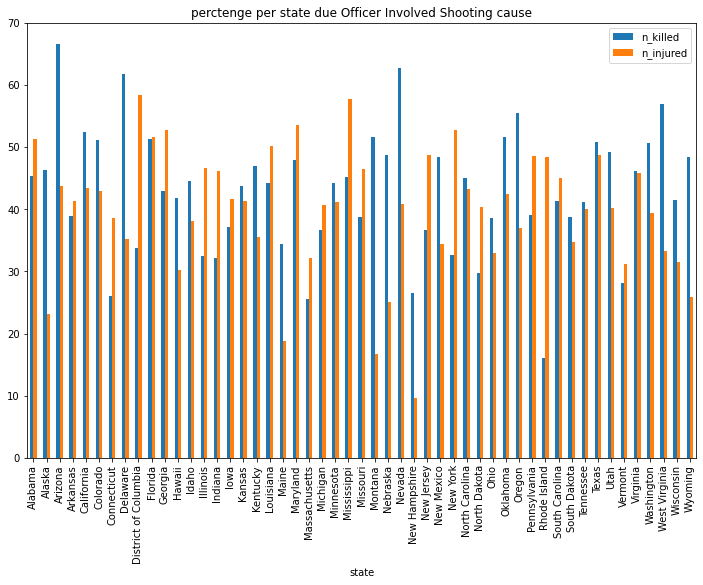

In [ ]:
# Normalize casualties per state due Officer involved shooting 
cause_Officer_perState = df[df['characteristics'].str.contains\
                                       ('Officer Involved Shooting')].groupby(['state'])\
.agg({'n_killed': 'sum','n_injured': 'sum'})

cause_Officer_perState_count = df[df['characteristics'].str.contains\
                                       ('Officer Involved Shooting')].groupby(['state'])\
.agg({'n_killed': 'count','n_injured': 'count'})

diff= (cause_Officer_perState/cause_Officer_perState_count)*100

diff.plot(y=["n_killed", "n_injured"], kind="bar",figsize=(12,8))

plt.title("perctenge per state due Officer Involved Shooting cause",fontsize=12)



In [ ]:
df.characteristics.str.contains\
                                       ('Drive-by').value_counts()

False    226022
True      13655
Name: characteristics, dtype: int64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text major ticklabel objects>)

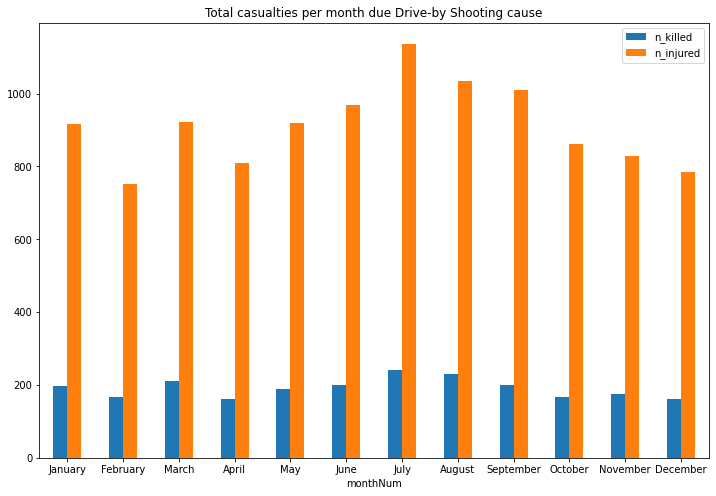

In [ ]:
# Total casualties per month due Drive-by involved shooting 
cause_Drive_by_perMonth = df[df['characteristics'].str.contains\
                                       ('Drive-by')].groupby(['monthNum'])\
.agg({'n_killed': 'sum','n_injured': 'sum'})

cause_Drive_by_perMonth.plot(y=["n_killed", "n_injured"], kind="bar",figsize=(12,8))\
      .set_xticklabels(("January", "February", "March", "April", "May",
      "June", "July", "August", "September","October",
      "November", "December"),fontsize=10)

plt.title("Total casualties per month due Drive-by Shooting cause",fontsize=12)
plt.xticks(rotation=0)

In [ ]:
df.characteristics.str.contains\
                                       ('Accidental Shooting').value_counts()

False    231464
True       8213
Name: characteristics, dtype: int64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text major ticklabel objects>)

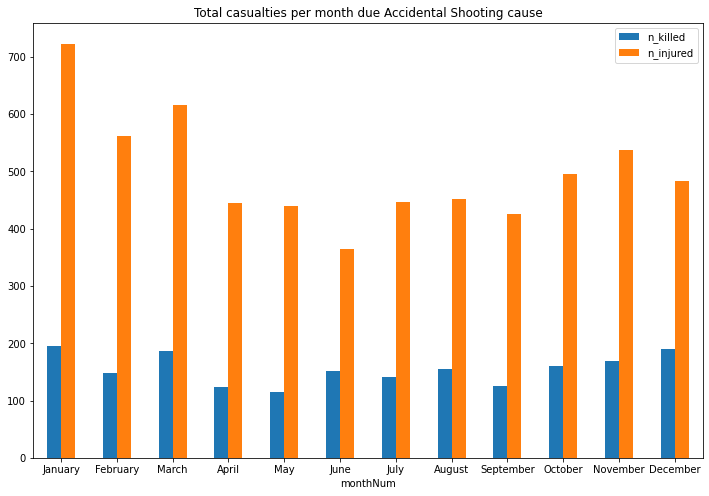

In [ ]:
# Total casualties per month due Accidental Shooting 
cause_Accidental_Shooting_perMonth = df[df['characteristics'].str.contains\
                                       ('Accidental Shooting')].groupby(['monthNum'])\
.agg({'n_killed': 'sum','n_injured': 'sum'})

cause_Accidental_Shooting_perMonth.plot(y=["n_killed", "n_injured"], kind="bar",figsize=(12,8))\
      .set_xticklabels(("January", "February", "March", "April", "May",
      "June", "July", "August", "September","October",
      "November", "December"),fontsize=10)

plt.title("Total casualties per month due Accidental Shooting cause",fontsize=12)
plt.xticks(rotation=0)

# Added by Elad, 11 April 

In [ ]:
df.count_male

0         3
1         1
2         5
3         3
4         2
         ..
239672    0
239673    2
239674    1
239675    1
239676    1
Name: count_male, Length: 239677, dtype: int64

Text(0, 0.5, 'Number of Males involved')

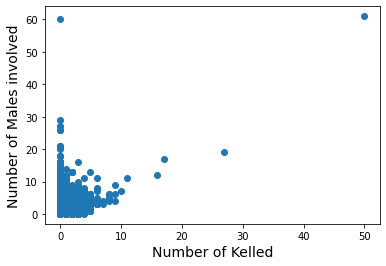

In [ ]:
plt.scatter(x=[df.n_killed], y=[df.count_male])

#killed_vs_male = df.plot.scatter(x='n_killed', y='count_male',figsize=(16,12))
#killed_vs_male.set_aspect(1)


plt.xlabel('Number of Kelled',fontsize=14)
plt.ylabel('Number of Males involved',fontsize=14)

Text(0, 0.5, 'Number of Females involved')

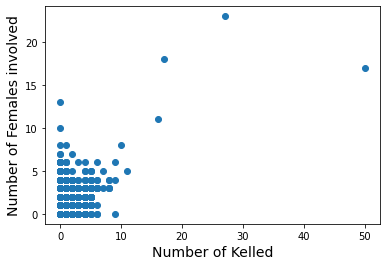

In [ ]:
plt.scatter(x=[df.n_killed], y=[df.count_female])

#killed_vs_male = df.plot.scatter(x='n_killed', y='count_female',figsize=(16,12))
#killed_vs_male.set_aspect(1)


plt.xlabel('Number of Kelled',fontsize=14)
plt.ylabel('Number of Females involved',fontsize=14)